In [33]:
import numpy as np
import pandas as pd 
import geopandas as gpd
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx
from descartes import PolygonPatch
from shapely.geometry import Point, Polygon, MultiPolygon, LineString

In [34]:
yerevan = gpd.read_file("/home/akansh-i2sc/Desktop/learn-GS_DL/learn-satellite-imagery-DL/notebooks/geo-pandas/Yerevan shapefile/Yerevan.shp")
yerevan.head()

,place_name,bbox_north,bbox_south,bbox_east,bbox_west,geometry
0,"Yerevan, Armenia",40.26241,40.0656851,44.6460194,44.4115546,"POLYGON ((449912.757 4449454.549, 450854.875 4..."


<Axes: >

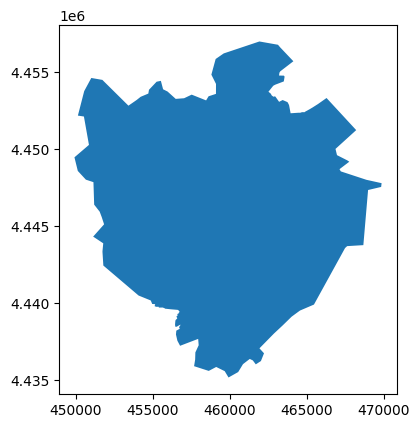

In [35]:
yerevan.plot()

In [36]:
yerevan.crs

<Projected CRS: EPSG:32638>
Name: WGS 84 / UTM zone 38N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 42°E and 48°E, northern hemisphere between equator and 84°N, onshore and offshore. Armenia. Azerbaijan. Djibouti. Eritrea. Ethiopia. Georgia. Islamic Republic of Iran. Iraq. kazakhstan. Kuwait. Russian Federation. Saudi Arabia. Somalia. Türkiye (Turkey). Yemen.
- bounds: (42.0, 0.0, 48.0, 84.0)
Coordinate Operation:
- name: UTM zone 38N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

epsg:4326
+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


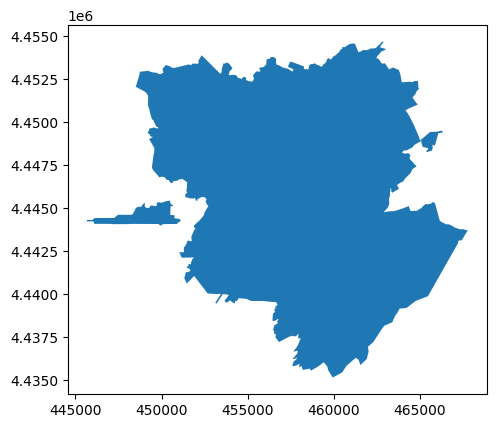

In [37]:
#load yearevan city from open street map using osmnx api
city = ox.geocode_to_gdf('Yerevan, Armenia')
print(city.crs)
city = ox.project_gdf(city)
print(city.crs)
ax = city.plot()

In [38]:
city.to_file("new_yerevan.shp")

/tmp/ipykernel_31899/993980747.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file("new_yerevan.shp")


### Division in grid

In [39]:
geometry = city['geometry'].iloc[0]
print(type(geometry))

<class 'shapely.geometry.multipolygon.MultiPolygon'>


In [40]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=500)
print(type(geometry_cut))

<class 'shapely.geometry.multipolygon.MultiPolygon'>


In [41]:
polylist = [poly for poly in geometry_cut.geoms]
polylist[4].centroid.coords[:][0]

(447489.538904129, 4444517.583181985)

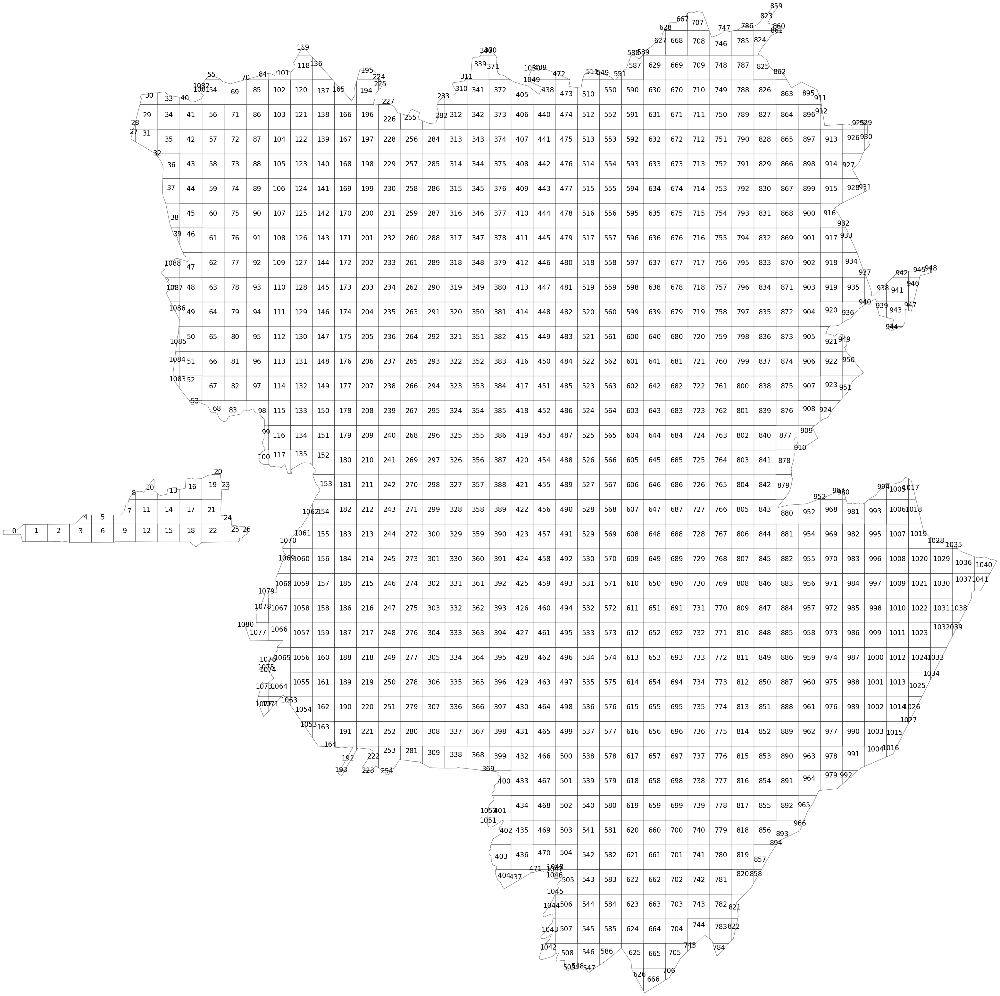

In [42]:
polylist = [poly for poly in geometry_cut.geoms]

# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

#### Berlin

In [ ]:
#load Berlin city from open street map using osmnx api
city = ox.geocode_to_gdf('Berlin, Germany')
print(city.crs)
city = ox.project_gdf(city)
print(city.crs)
ax = city.plot()

geometry = city['geometry'].iloc[0]
print(type(geometry))

In [15]:
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=500)
print(type(geometry_cut))

polylist = [poly for poly in geometry_cut.geoms]
polylist[4].centroid.coords[:][0]

<class 'shapely.geometry.multipolygon.MultiPolygon'>


(370773.7786991499, 5809677.92259468)

In [ ]:
polylist = [poly for poly in geometry_cut.geoms]

# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut.geoms, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=7)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

#### Using Armenia dataset for now

In [51]:
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.crs
print(polyframe.crs)
polyframe.head()
#ox.project_gdf(polyframe, to_latlong=True) ## to convert to lat long

+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((445666.158 4444235.137, 445666.521 4..."
1,"POLYGON ((446157.616 4444430.438, 446649.074 4..."
2,"POLYGON ((446649.074 4444433.203, 447140.532 4..."
3,"POLYGON ((447140.532 4444435.968, 447251.901 4..."
4,"POLYGON ((447255.917 4444440.012, 447465.163 4..."


(4875516.303074205, 4901138.627477903)

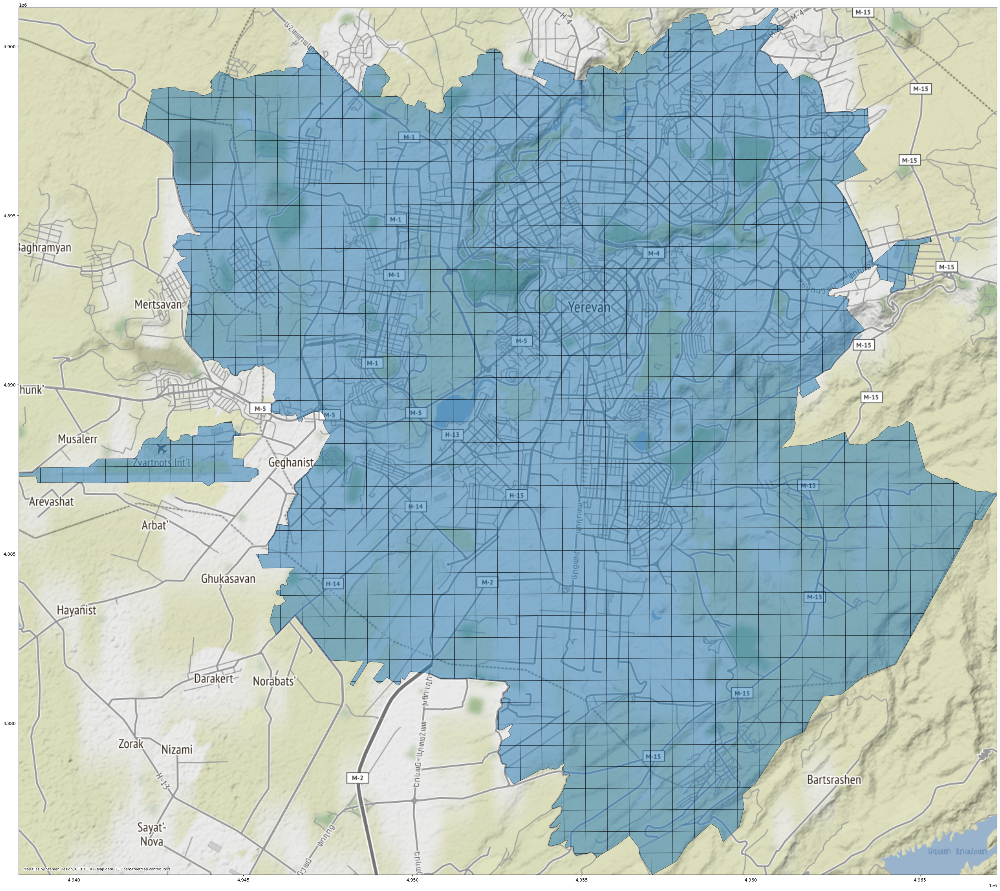

In [57]:
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

### Reading geotiff file

In [71]:
## load population data from geotiff file for berlin city
import rasterio
from rasterio.plot import show
from rasterio.mask import mask
from shapely.geometry import mapping

# Read the population dataset
dataset = rasterio.open("/home/akansh-i2sc/Desktop/ds_project/population_deu_2019-07-01_geotiff_1/population_deu_2019-07-01.tif")

file_path = "/home/akansh-i2sc/Desktop/ds_project/population_deu_2019-07-01_geotiff_1/population_deu_2019-07-01.tif"

In [63]:
import rasterio

# Open the GeoTIFF file
# file_path = "path/to/your/population_density_geotiff.tif"
# dataset = rasterio.open(file_path)

# Define the geographic boundaries of Berlin
berlin_min_lon = 13.0832
berlin_min_lat = 52.3418
berlin_max_lon = 13.7573
berlin_max_lat = 52.6776

# Convert the geographic boundaries to pixel indices
berlin_min_row, berlin_min_col = dataset.index(berlin_min_lon, berlin_min_lat)
berlin_max_row, berlin_max_col = dataset.index(berlin_max_lon, berlin_max_lat)

# Read the population density data for Berlin
berlin_data = dataset.read(1, window=((berlin_min_row, berlin_max_row + 1), (berlin_min_col, berlin_max_col + 1)))

# Close the dataset
dataset.close()


In [96]:
df_pop = pd.read_csv("/home/akansh-i2sc/Downloads/Compressed/population_deu_2019-07-01.csv")

In [101]:
gdf = gpd.GeoDataFrame(
    df_pop, geometry=gpd.points_from_xy(df_pop.Lon, df_pop.Lat)
)

In [104]:
gdf

,Lat,Lon,Population,geometry
0,50.911806,6.717917,3.774709,POINT (6.71792 50.91181)
1,52.041806,14.516250,0.931790,POINT (14.51625 52.04181)
2,49.426250,7.744028,3.666325,POINT (7.74403 49.42625)
3,50.870694,6.664028,3.774709,POINT (6.66403 50.87069)
4,50.881528,6.599861,3.774709,POINT (6.59986 50.88153)
...,...,...,...,...
32446523,52.925417,9.049028,1.331796,POINT (9.04903 52.92542)
32446524,52.959306,8.979028,1.331796,POINT (8.97903 52.95931)
32446525,52.964861,9.004583,1.331796,POINT (9.00458 52.96486)
32446526,52.966806,9.016806,1.331796,POINT (9.01681 52.96681)
